In [1]:
import pandas as pd
import numpy as npy
import folium
from folium.plugins import MarkerCluster, HeatMap
from geopy.geocoders import Nominatim
from geopy.point import Point
import geopandas as gpd


# Configurar pandas para mostrar todas las filas y columnas
pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.width', None)
#pd.set_option('display.max_colwidth', None)

In [2]:
df=pd.read_excel(r"E:\Cursos\BC_Data_Science\Repositorio\ONLINE_DS_THEBRIDGE_V\proyecto EDA\DATASETS\EXCEL\filtrado_ips_destino.xlsx")

In [8]:
df_oce=pd.read_xslx(r'E:\Cursos\BC_Data_Science\Repositorio\ONLINE_DS_THEBRIDGE_V\proyecto EDA\DATASETS\DATASETS MODIFICADOS\tuplas_coordendas_ocean_shp.csv')

AttributeError: module 'pandas' has no attribute 'read_xslx'

In [3]:
df_eda=pd.read_excel(r"E:\Cursos\BC_Data_Science\Repositorio\ONLINE_DS_THEBRIDGE_V\proyecto EDA\DATASETS\DATASETS MODIFICADOS\ciber_modificado_ciudades_final.xlsx")

In [9]:
df_oce.head(2)

,Latitud,Longitud
0,59.916026,-67.400486
1,59.678559,-67.394138


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2228 entries, 0 to 2227
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   IP        2228 non-null   object 
 1   Latitud   2228 non-null   float64
 2   Longitud  2228 non-null   float64
dtypes: float64(2), object(1)
memory usage: 52.3+ KB


In [9]:
# Crear tuplas de (Latitud, Longitud) para cada fila
tuplas_geo_destino = df.apply(lambda row: (row['Latitud'], row['Longitud']), axis=1)

In [11]:
print(tuplas_geo_destino)

0                     (121.6449837, 25.1145207)
1                      (45.4761809, 35.5589786)
2                     (127.3838237, 37.6966296)
3                      (42.7517718, 50.6556236)
4             (-94.47598020316175, 44.29691045)
5                      (18.4523777, 69.1845449)
6                       (114.9345065, 4.983658)
7                     (121.1419098, 24.9152084)
8                      (45.3846343, 35.5739937)
9                       (38.362664, 39.4050933)
10                      (0.1873576, 47.2970241)
11                   (-104.5827941, 50.8060389)
12                      (51.5382925, 35.734621)
13                    (120.9996248, 14.5273072)
14                     (52.4938765, 29.6412408)
15             (25.08581042446392, 60.23652005)
16                     (-3.5663894, 48.2510617)
17                     (34.9511585, 32.1532905)
18                     (62.3763039, 27.3428483)
19              (17.9051338647764, 53.10056055)
20                     (45.4083169, 35.5

In [5]:
#leer el archivo shp descargado de www.naturalearthdata.com
df_ocean = gpd.read_file(r"C:\Users\victo\Desktop\OCEAN\ne_10m_ocean_scale_rank.shp")

In [13]:

# Convertir la tupla a una lista de tuplas
tuplas_geo_lista = list(tuplas_geo_destino)



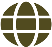
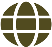
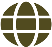
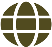
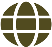
...
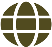
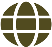
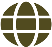
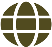
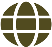

In [16]:
#USANDO GEOPANDAS Y UN ARCHIVO SHP DONDE ESTAN LAS COORDENADAS DE AGAUA PARA FILTAR LAS IP QUE DA EN AGUA, y FOLIUM PARA REPRESENTAR MAPA (IPS DESTNNO)

# Convertir la tupla a una lista de tuplas
tuplas_geo_lista = list(tuplas_geo_destino)

#leer el archivo shp descargado de www.naturalearthdata.com con las coordenas que son mar
df = gpd.read_file(r"C:\Users\victo\Desktop\OCEAN\ne_10m_ocean_scale_rank.shp")

# Obtener las coordenadas de áreas de agua
coordenadas_agua = df_oce[["Latitud", "Longitud"]].values.tolist()

# Filtrar las coordenadas que dan en agua
tuplas_en_agua = [tupla for tupla in tuplas_geo_lista if tupla in coordenadas_agua]

# Comprobar si la lista de coordenadas de agua está vacía
if not tuplas_en_agua:
  # No mostrar el mapa de calor
  pass
else:
  # Calcular el centro del mapa
  center_lat = sum(lat for lat, lon in tuplas_en_agua) / len(tuplas_en_agua)
  center_lon = sum(lon for lat, lon in tuplas_en_agua) / len(tuplas_en_agua)

# Crear un objeto de mapa centrado en la primera ubicación
mapa = folium.Map(location=tuplas_geo_lista[0], zoom_start=10)

# Agregar un grupo de marcadores
marker_cluster = MarkerCluster().add_to(mapa)

# Agregar marcadores al grupo con iconos personalizados
for tupla in tuplas_geo_lista:
    # Cargar el ícono personalizado
    icono_personalizado = folium.CustomIcon(icon_image=r'C:\Users\victo\Pictures\internet_icon.png', icon_size=(30, 30))
    
    # Agregar el marcador con el icono personalizado
    folium.Marker(location=tupla, icon=icono_personalizado).add_to(marker_cluster)

# Agregar un mapa de calor
HeatMap(tuplas_geo_lista).add_to(mapa)

# Guardar el mapa como un archivo HTML
mapa.save(r'E:\Cursos\BC_Data_Science\Repositorio\ONLINE_DS_THEBRIDGE_V\proyecto EDA\DATASETS\MAPAS\mapa_geolocalizado_ips_destino_2228_agua.html')

# Mostrar el mapa en la notebook
display(mapa)



In [14]:
tuplas_geo_lista

[(121.6449837, 25.1145207),
 (45.4761809, 35.5589786),
 (127.3838237, 37.6966296),
 (42.7517718, 50.6556236),
 (-94.47598020316175, 44.29691045),
 (18.4523777, 69.1845449),
 (114.9345065, 4.983658),
 (121.1419098, 24.9152084),
 (45.3846343, 35.5739937),
 (38.362664, 39.4050933),
 (0.1873576, 47.2970241),
 (-104.5827941, 50.8060389),
 (51.5382925, 35.734621),
 (120.9996248, 14.5273072),
 (52.4938765, 29.6412408),
 (25.08581042446392, 60.23652005),
 (-3.5663894, 48.2510617),
 (34.9511585, 32.1532905),
 (62.3763039, 27.3428483),
 (17.9051338647764, 53.10056055),
 (45.4083169, 35.5941417),
 (-93.5353, 36.518031),
 (0.7421650487864491, 40.71372545),
 (130.9472106, 31.8096437),
 (5.327729, 59.872329),
 (52.6579732, 29.5638951),
 (50.5440558, 26.1855105),
 (45.4108696, 35.5878746),
 (18.975981, 50.2822343),
 (50.5791781, 26.2283872),
 (45.3960512, 35.5766748),
 (106.6799129, 10.8436675),
 (14.4865539, 35.9111395),
 (121.3733754, 25.0713454),
 (1.4450105, 47.156021),
 (32.0327151, 64.2555312),

In [3]:

df_2_origen=pd.read_excel(r"E:\Cursos\BC_Data_Science\Repositorio\ONLINE_DS_THEBRIDGE_V\proyecto EDA\DATASETS\EXCEL\ips_origen_2vez.xlsx")


In [4]:
df_2_origen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1426 entries, 0 to 1425
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Column3  1426 non-null   int64
 1   Column5  1426 non-null   int64
dtypes: int64(2)
memory usage: 22.4 KB


In [1]:

lista_origen= df_2_origen.values.tolist()

NameError: name 'df_2_origen' is not defined


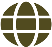
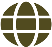
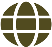
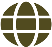
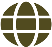
...
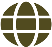
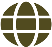
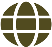
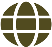
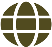

In [6]:
# ip origen VEZ( 1426 resgrttros solo)

#convierto en lista
lista_origen=df_2_origen.values.tolist()


# Calcular el centro del mapa
center_lat = sum(lat for lat, lon in lista_origen) / len(lista_origen)
center_lon = sum(lon for lat, lon in lista_origen) / len(lista_origen)

# Crear un objeto de mapa centrado en la primera ubicación
mapa = folium.Map(location=lista_origen[0], zoom_start=10)

# Agregar un grupo de marcadores
marker_cluster = MarkerCluster().add_to(mapa)

# Agregar marcadores al grupo con iconos personalizados
for tupla in lista_origen:
    # Cargar el ícono personalizado
    icono_personalizado = folium.CustomIcon(icon_image=r'C:\Users\victo\Pictures\internet_icon.png', icon_size=(30, 30))
    
    # Agregar el marcador con el icono personalizado
    folium.Marker(location=tupla, icon=icono_personalizado).add_to(marker_cluster)

# Agregar un mapa de calor
HeatMap(lista_origen).add_to(mapa)

# Guardar el mapa como un archivo HTML
mapa.save(r'E:\Cursos\BC_Data_Science\Repositorio\ONLINE_DS_THEBRIDGE_V\proyecto EDA\DATASETS\MAPAS\mapa_geolocalizado_ips_origen_1426.html')

# Mostrar el mapa en la notebook
display(mapa)